# Vehicle Detection Project

The goals / steps of this project are the following:

- Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
- Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
- Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
- Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
- Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
- Estimate a bounding box for vehicles detected.
---
1. Step 1: Make a Classifier
2.  Step 2: Make a Pipeline
3.  Step 3: Test on videos

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from skimage.feature import hog
import pickle

import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

from scipy.ndimage.measurements import label

C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


# Step 1: Make a Classifier
- Data exploration
- Data preprocessing
- Model traning

## 1.1 Data exploration

In [2]:
folders_car = glob.glob('data/vehicles/*')
folders_notcar = glob.glob('data/non-vehicles/*')

car_folder_names = [f.split('\\')[-1] for f in folders_car]
notcar_folder_names  = [f.split('\\')[-1] for f in folders_notcar]

In [9]:
print("Car data are in following folders:    ", car_folder_names)
print("NotCar data are in following folders: ", notcar_folder_names)

Car data are in following folders:     ['GTI_Far', 'GTI_Left', 'GTI_MiddleClose', 'GTI_Right', 'KITTI_extracted']
NotCar data are in following folders:  ['Extras', 'GTI']


In [3]:
# create lists to collect data
car_list = []
notcar_list = []

for folder in car_folder_names:
    f_names = glob.glob('data/vehicles/'+ folder + '/*.png')
    for f_name in f_names:
        car_list.append(f_name)
        
for folder in notcar_folder_names:
    f_names = glob.glob('data/non-vehicles/'+ folder + '/*.png')
    for f_name in f_names:
        notcar_list.append(f_name)

In [32]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


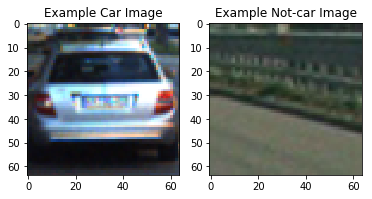

In [36]:
data_info = data_look(car_list, notcar_list)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(car_list))
notcar_ind = np.random.randint(0, len(notcar_list))
    
# Read in car / not-car images
car_image = mpimg.imread(car_list[car_ind])
notcar_image = mpimg.imread(notcar_list[notcar_ind])


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')

In [80]:
# Remember the image for later usage!!
car_list[car_ind], notcar_list[notcar_ind]

('data/vehicles/KITTI_extracted\\1763.png',
 'data/non-vehicles/GTI\\image3247.png')

In [5]:
# Read in car / not-car test image
car_image = mpimg.imread('data/vehicles/KITTI_extracted/1763.png')
notcar_image = mpimg.imread('data/non-vehicles/GTI/image3247.png')

# Read in car / not-car images with CV2
car_image2 = cv2.imread('data/vehicles/KITTI_extracted/1763.png')
notcar_image2 = cv2.imread('data/non-vehicles/GTI/image3247.png')
# Convert BGR to RGB
car_image2 = cv2.cvtColor(car_image2, cv2.COLOR_BGR2RGB) 
notcar_image2 = cv2.cvtColor(notcar_image2, cv2.COLOR_BGR2RGB) 

## 1.2 Data preprocessing
- Feature extraction
- Label extraction
- Save the data for later use

### 1.2.1 Feature Extraction
- Compute Spatial features:  extract raw pixel features. We do not want all pixels because it is computational expensive. Therefore we resize the image into smaller size. And we transform it into feature vector by RAVEL().
- Compute Color histogram features: cars can be identified by its color. Different color space can be adapted: RGB, HSV ...
- Compute HOG features: These features can identify car shape. We will convert image to grayscale, use scikit-image.hog()
- Combine: we will combine all features extracted from above steps.
- Normalization: We want all features contribute evenly to the model training. We will use Scikit-learn StandardScaler.

1.2.1.1 ** _Resizing the image in order to improve computational efficiency_ **: cv2.resize()

In [72]:
car_img_resized  = cv2.resize(car_image, (32,32))

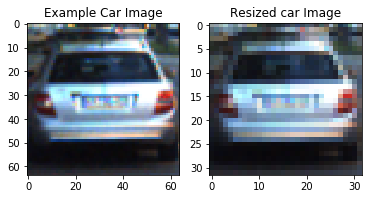

In [74]:
# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(car_img_resized)
plt.title('Resized car Image')

1.2.1.2 ** _Histograms of Color_ **: np.histogram()

In [39]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    # rhist[0] contains the counts in each of the bins
    # rhist[1] contains the bin edges (so it is one element longer than rhist[0]).
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features

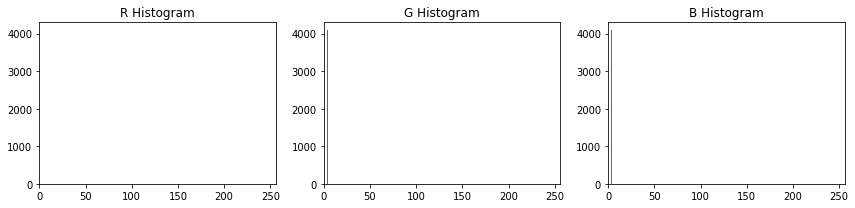

In [70]:
rh, gh, bh, bincen, feature_vec = color_hist(car_image, nbins=32, bins_range=(0, 256))

# Plot a figure with all three bar charts
if rh is not None:
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('Your function is returning None for at least one variable...')

** OOPS!! This seems NOT RIGHT **. WHY it has only 1 value?!!

**Problem**: Matplotlib image will read .png file in on a scale of 0 to 1, but cv2.imread() will scale them from 0 to 255.

**Solution**: Read .png with cv2.imread()

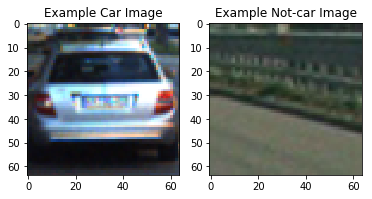

In [76]:
# Read in car / not-car images
car_image2 = cv2.imread(car_list[car_ind])
notcar_image2 = cv2.imread(notcar_list[notcar_ind])

# Convert BGR to RGB
car_image2 = cv2.cvtColor(car_image2, cv2.COLOR_BGR2RGB) 
notcar_image2 = cv2.cvtColor(notcar_image2, cv2.COLOR_BGR2RGB) 

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image2)
plt.title('Example Not-car Image')

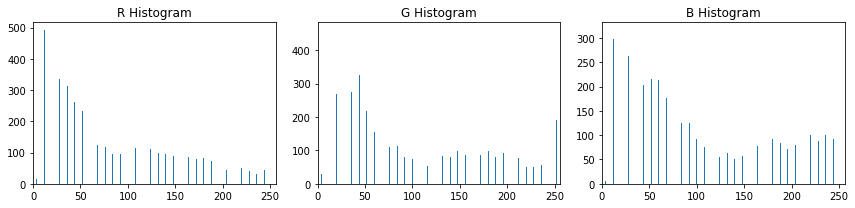

In [78]:
rh, gh, bh, bincen, feature_vec = color_hist(car_image2, nbins=32, bins_range=(0, 256))

# Plot a figure with all three bar charts
if rh is not None:
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('Your function is returning None for at least one variable...')

1.2.1.3 ** _Histogram of Oriented Gradient (HOG)_ **: scikit-image.hog()

In [7]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [10]:
######## Try1: RGB gray scale ######################################################
# Grayscale 
gray1 = cv2.cvtColor(car_image2, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(notcar_image2, cv2.COLOR_RGB2GRAY)
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features_car, hog_image_car = get_hog_features(gray1, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
features_notcar, hog_image_notcar = get_hog_features(gray2, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


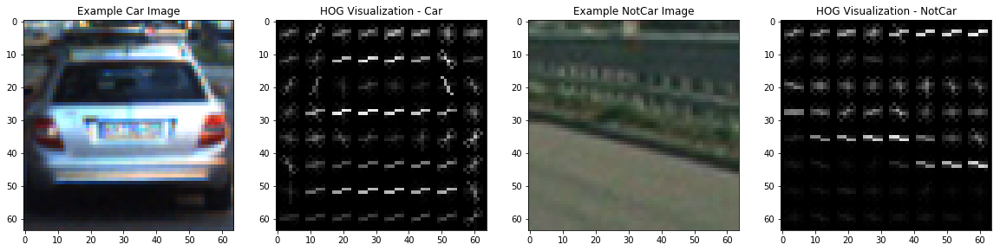

In [15]:
# Plot the examples
fig = plt.figure(figsize=(20,7))
plt.subplot(141)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(142)
plt.imshow(hog_image_car, cmap='gray')
plt.title('HOG Visualization - Car')
plt.subplot(143)
plt.imshow(notcar_image2, cmap='gray')
plt.title('Example NotCar Image')
plt.subplot(144)
plt.imshow(hog_image_notcar, cmap='gray')
plt.title('HOG Visualization - NotCar')

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


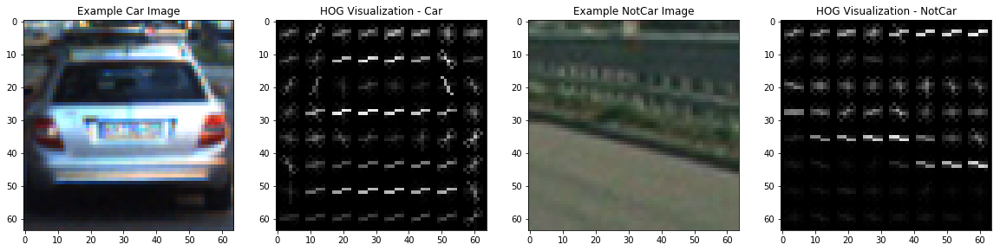

In [24]:
######## Try2: YCrCb, Channel 0 ######################################################
yc1 = cv2.cvtColor(car_image2, cv2.COLOR_RGB2YCrCb)
yc2 = cv2.cvtColor(notcar_image2, cv2.COLOR_RGB2YCrCb)
# Get only one channel - 0
yc1 = yc1[:,:,0]
yc2 = yc2[:,:,0]
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features_car, hog_image_car = get_hog_features(yc1, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
features_notcar, hog_image_notcar = get_hog_features(yc2, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure(figsize=(20,7))
plt.subplot(141)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(142)
plt.imshow(hog_image_car, cmap='gray')
plt.title('HOG Visualization - Car')
plt.subplot(143)
plt.imshow(notcar_image2, cmap='gray')
plt.title('Example NotCar Image')
plt.subplot(144)
plt.imshow(hog_image_notcar, cmap='gray')
plt.title('HOG Visualization - NotCar')

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


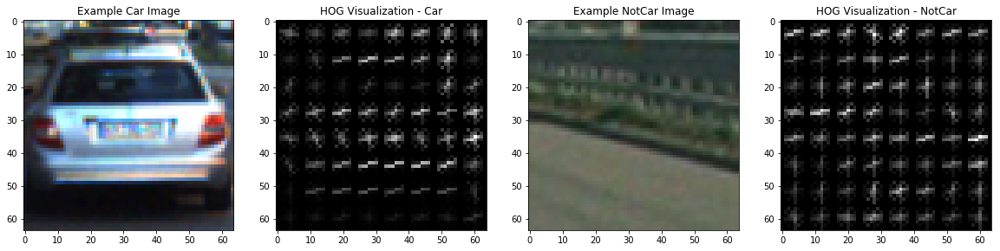

In [25]:
######## Try3: YCrCb, Channel 1 ######################################################
yc1 = cv2.cvtColor(car_image2, cv2.COLOR_RGB2YCrCb)
yc2 = cv2.cvtColor(notcar_image2, cv2.COLOR_RGB2YCrCb)
# Get only one channel - 0
yc1 = yc1[:,:,1]
yc2 = yc2[:,:,1]
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features_car, hog_image_car = get_hog_features(yc1, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
features_notcar, hog_image_notcar = get_hog_features(yc2, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure(figsize=(20,7))
plt.subplot(141)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(142)
plt.imshow(hog_image_car, cmap='gray')
plt.title('HOG Visualization - Car')
plt.subplot(143)
plt.imshow(notcar_image2, cmap='gray')
plt.title('Example NotCar Image')
plt.subplot(144)
plt.imshow(hog_image_notcar, cmap='gray')
plt.title('HOG Visualization - NotCar')

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


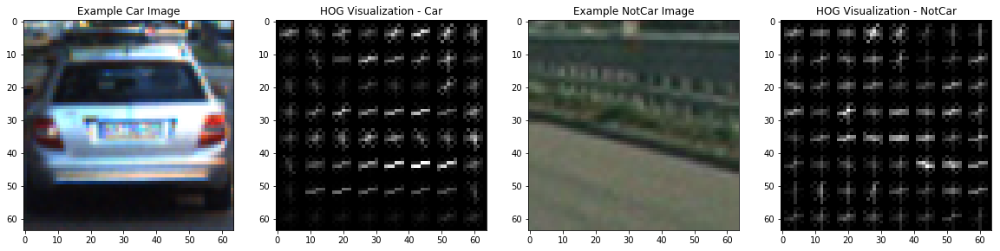

In [27]:
######## Try4: YCrCb, Channel 2 ######################################################
yc1 = cv2.cvtColor(car_image2, cv2.COLOR_RGB2YCrCb)
yc2 = cv2.cvtColor(notcar_image2, cv2.COLOR_RGB2YCrCb)
# Get only one channel - 0
yc1 = yc1[:,:,2]
yc2 = yc2[:,:,2]
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features_car, hog_image_car = get_hog_features(yc1, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)
features_notcar, hog_image_notcar = get_hog_features(yc2, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure(figsize=(20,7))
plt.subplot(141)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(142)
plt.imshow(hog_image_car, cmap='gray')
plt.title('HOG Visualization - Car')
plt.subplot(143)
plt.imshow(notcar_image2, cmap='gray')
plt.title('Example NotCar Image')
plt.subplot(144)
plt.imshow(hog_image_notcar, cmap='gray')
plt.title('HOG Visualization - NotCar')

** Each channel HOG works to differentiate Car and NotCar. So we should combine all Channels as final HOG features. **

#### Put all together, create a feature extraction function

In [155]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [156]:
# Define a function to extract features from a single image window
def features_extraction(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

In [25]:
### Read in single image with CV2: car_image2, notcar_image2 #####
car_image2 = cv2.imread('data/vehicles/KITTI_extracted/1763.png')
notcar_image2 = cv2.imread('data/non-vehicles/GTI/image3247.png')
# Convert BGR to RGB
car_image2 = cv2.cvtColor(car_image2, cv2.COLOR_BGR2RGB) 
notcar_image2 = cv2.cvtColor(notcar_image2, cv2.COLOR_BGR2RGB) 

### Apply the image to the function: Tweak these parameters and see how the results change.
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()

car_features = features_extraction(car_image2, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction(notcar_image2, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)


C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


In [29]:
print('Car image total features: ', car_features.shape)
print('NotCar image total features: ', notcar_features.shape)

Car image total features:  (2580,)
NotCar image total features:  (2580,)


1.2.1.4 ** _Normalization_ **: Scikit-learn.StandardScaler()

In [31]:
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

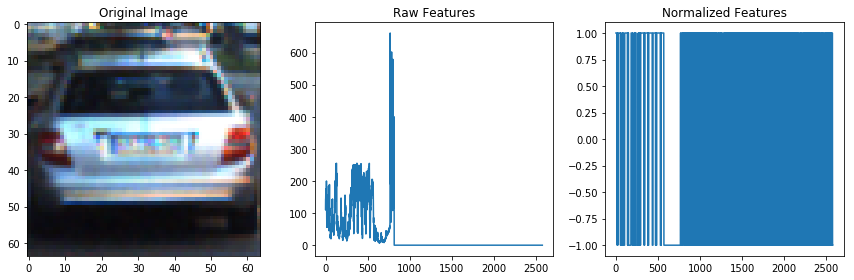

In [35]:
# Plot the example of raw and scaled features
fig = plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(car_image2)
plt.title('Original Image')
plt.subplot(132)
plt.plot(X[0])
plt.title('Raw Features')
plt.subplot(133)
plt.plot(scaled_X[0])
plt.title('Normalized Features')
fig.tight_layout()

** Feature Extraction for all images **

In [28]:
# Define a function to extract features from a list of images
def features_extraction_all(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one with CV2
        image = cv2.imread(file)
        # Convert BGR to RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [29]:
# make sure image filenames are collected
assert car_list, "Please get the car image filenames!!!"
assert notcar_list, "Please get the NotCar image filenames!!!"

In [48]:
####### Parameters to twick ####################################
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "All" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()
####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


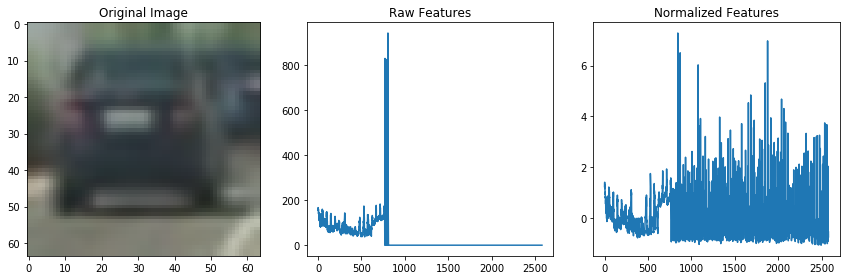

In [59]:
# Plot an random example of raw and scaled features
car_ind = np.random.randint(0, len(cars))
fig = plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(mpimg.imread(car_list[car_ind]))
plt.title('Original Image')
plt.subplot(132)
plt.plot(X[car_ind])
plt.title('Raw Features')
plt.subplot(133)
plt.plot(scaled_X[car_ind])
plt.title('Normalized Features')
fig.tight_layout()

In [63]:
assert X.shape[0] == len(car_list) + len(notcar_list), "Something is wrong!!!"
X.shape

(17760, 2580)

### 1.2.2 Label extraction

In [64]:
# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

In [66]:
y.shape

(17760,)

### 1.2.3 Save the data

In [73]:
scaled_X.shape

(17760, 2580)

In [78]:
# Store data (serializ)
with open('data/X.pkl', 'wb') as handle:
    pickle.dump(scaled_X, handle)
with open('data/y.pkl', 'wb') as handle:
    pickle.dump(y, handle)

## 1.3 Model traning
- load the data: features and labels
- Shuffle the data and splitting data into training and test
- Model selection: SVM
- Train the model:  
  - Cross validation
  - hyperparameters tuning
  - Accuracy

### 1.3.1 load the data

In [22]:
# Load data (deserialize)
with open('data/X.pkl', 'rb') as handle:
    X = pickle.load(handle)
with open('data/y.pkl', 'rb') as handle:
    y = pickle.load(handle)

In [85]:
X.shape, y.shape

((17760, 2580), (17760,))

### 1.3.2 Shuffle the data and splitting data into training and test

In [24]:
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 2580


In [90]:
X_train.shape, X_test.shape

((14208, 2580), (3552, 2580))

### 1.3.3 Train the model

In [25]:
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

7.18 Seconds to train SVC...
Test Accuracy of SVC =  0.9775


### 1.3.4 Test the model with the example image

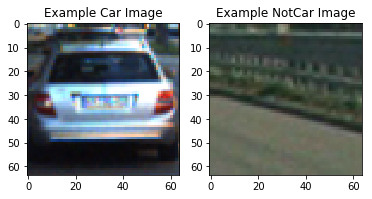

In [115]:
# Read in car / not-car images with CV2
car_image2 = cv2.imread('data/vehicles/KITTI_extracted/1763.png')
notcar_image2 = cv2.imread('data/non-vehicles/GTI/image3247.png')
# Convert BGR to RGB
car_image2 = cv2.cvtColor(car_image2, cv2.COLOR_BGR2RGB) 
notcar_image2 = cv2.cvtColor(notcar_image2, cv2.COLOR_BGR2RGB) 

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image2)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image2)
plt.title('Example NotCar Image')

In [117]:
####### Parameters to twick ####################################
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()

####### Extract Features #######################################
features = features_extraction(car_image2, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(features)
# Apply the scaler to X
test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

####### Predict ################################################
prediction1 = svc.predict(test_features)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


In [118]:
####### Extract Features #######################################
features = features_extraction(notcar_image2, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(features)
# Apply the scaler to X
test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

####### Predict ################################################
prediction2 = svc.predict(test_features)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


In [119]:
prediction1[0], prediction2[0]

(1.0, 1.0)

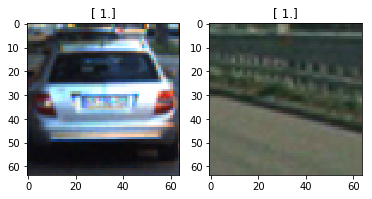

In [120]:
# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image2)
plt.title(prediction1)
plt.subplot(122)
plt.imshow(notcar_image2)
plt.title(prediction2)

** GREAT!! Even thought the second image prediction is incorrect. But I am sure the code is working.**
** I can move forward to build the pipeline and then tune the prameters **

### 1.3.5 Test the model with a few example images

In [11]:
# randomly pickup 10 images each from car_list and notcar_list
cars = np.random.randint(0, len(car_list), size=10)
notcars = np.random.randint(0, len(car_list), size=10)

In [12]:
imgs_cars = []
imgs_notcars = []
for i in range(10):
    img = cv2.imread(car_list[cars[i]])
    imgs_cars.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) )
    img = cv2.imread(notcar_list[notcars[i]])
    imgs_notcars.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) )    

In [13]:
labels_cars = ["Car"]*len(imgs_cars)
labels_notcars = ["NotCar"]*len(imgs_notcars)

In [14]:
def plot_images(images, labels, pred=None):
    assert len(images) == len(labels) == 10
    
    # Create figure with 2x5 sub-plots.
    fig, axes = plt.subplots(2, 5, figsize=(20,7))
    fig.subplots_adjust(hspace=0.1, wspace=0.1)

    for i, ax in enumerate(axes.flat):
        # Plot image.
        ax.imshow(images[i]) 

        # Show true and predicted classes.
        if pred is None:
            xlabel = "{0}".format(labels[i])
        else:
            xlabel = "{0} -> {1}".format(labels[i], pred[i])

        ax.set_xlabel(xlabel)
        
        # Remove ticks from the plot.
        ax.set_xticks([])
        ax.set_yticks([])

In [26]:
cars_preds = []
notcars_preds = []
for img in imgs_cars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    cars_preds.append(prediction[0])

for img in imgs_notcars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    notcars_preds.append(prediction[0])

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C

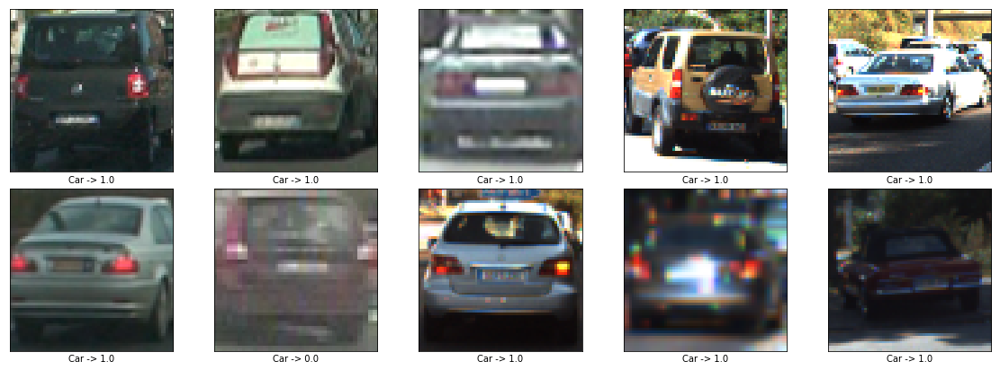

In [27]:
plot_images(imgs_cars, labels_cars, cars_preds)

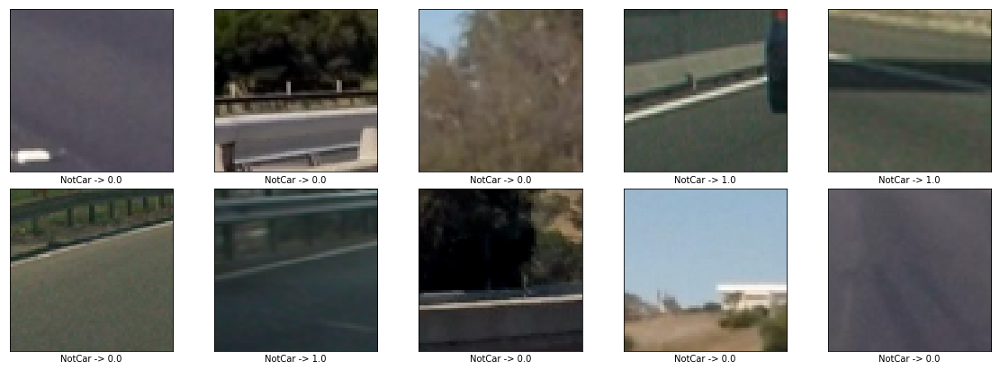

In [28]:
plot_images(imgs_notcars, labels_notcars, notcars_preds)

** Test Results: **
- Cars predictions 9 conrrect 1 incorrect.
- NotCars predictions 7 corrrect 3 incorrect.
- **Conclusion**: the model is not good at predicting NotCar image. It seems as soon as there is line shape, the model predict it as Car.

### Improving the accuracy by tuning Feature extraction parameters
### Try 1: 
- color_space: YCrCb
- hog_channel: All

In [29]:
####### Parameters to twick ####################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 6108
14.44 Seconds to train SVC...
Test Accuracy of SVC =  0.9921


In [30]:
cars_preds = []
notcars_preds = []
for img in imgs_cars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    cars_preds.append(prediction[0])

for img in imgs_notcars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    notcars_preds.append(prediction[0])

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C

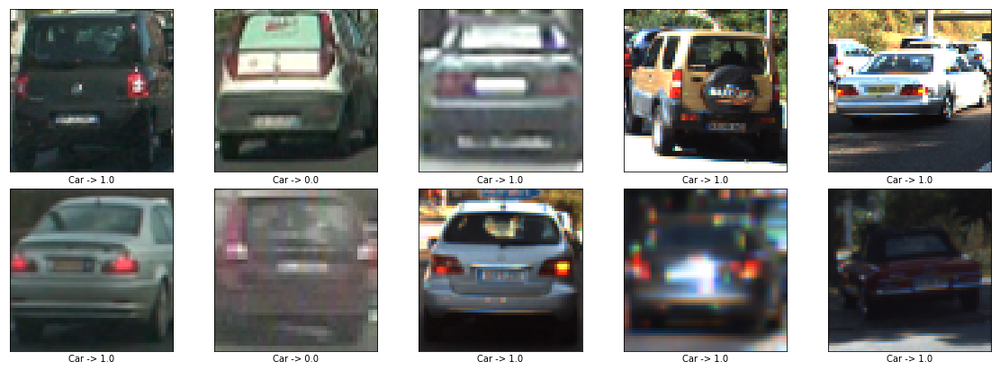

In [31]:
plot_images(imgs_cars, labels_cars, cars_preds)

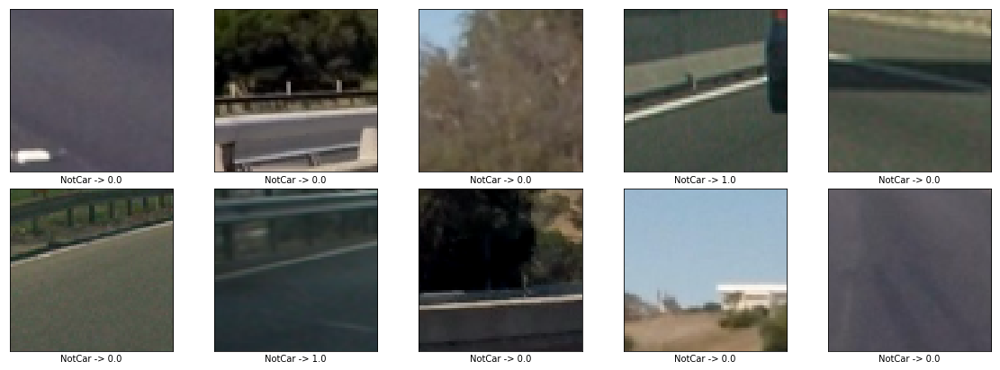

In [32]:
plot_images(imgs_notcars, labels_notcars, notcars_preds)

** Test Results: **
- Accuracy improved from 0.9775 to 0.9921.
- Cars predictions 8 corrrect 2 incorrect.
- NotCars predictions 8 corrrect 2 incorrect.
- **Conclusion**: improved little bit. But still struggling with images with line shape.

### Try 2: 
- color_space: YCrCb
- hog_channel: All
- spatial_size = (8, 8)
- hist_bins = 8

In [34]:
####### Parameters to twick ####################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (8, 8) # Spatial binning dimensions
hist_bins = 8    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 5508
4.15 Seconds to train SVC...
Test Accuracy of SVC =  0.9947


In [35]:
cars_preds = []
notcars_preds = []
for img in imgs_cars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    cars_preds.append(prediction[0])

for img in imgs_notcars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    notcars_preds.append(prediction[0])

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C

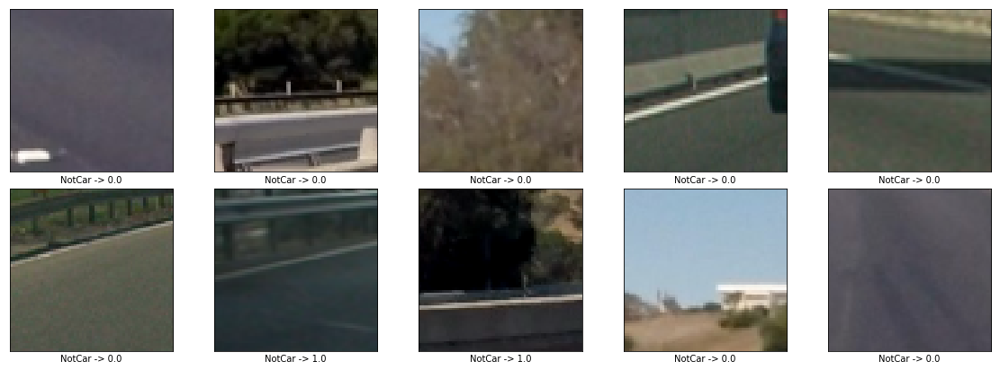

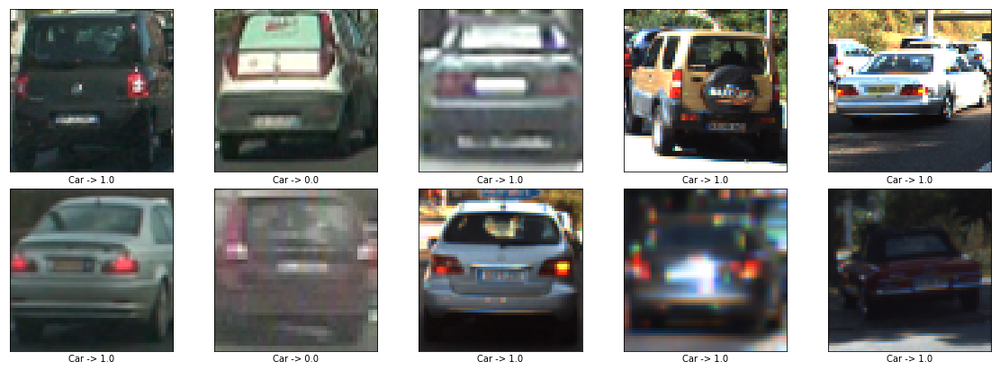

In [36]:
plot_images(imgs_notcars, labels_notcars, notcars_preds)
plot_images(imgs_cars, labels_cars, cars_preds)

### Try 3: 
- color_space: YCrCb
- hog_channel: All
- pix_per_cell = 16
- cell_per_block = 4 
- spatial_size = (16, 16)
- hist_bins = 16

In [73]:
####### Parameters to twick ####################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 4 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 16 pixels per cell and 4 cells per block
Feature vector length: 1248
2.35 Seconds to train SVC...
Test Accuracy of SVC =  0.9885


### Try 4: 
- color_space: LUV
- hog_channel: All
- pix_per_cell = 16
- cell_per_block = 4 
- spatial_size = (32, 32)
- hist_bins = 32

In [74]:
####### Parameters to twick ####################################
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 4 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 16 pixels per cell and 4 cells per block
Feature vector length: 3600
9.03 Seconds to train SVC...
Test Accuracy of SVC =  0.9916


### Try 5: 
- color_space: YCrCb
- hog_channel: All
- pix_per_cell = 16
- cell_per_block = 4 
- spatial_size = (32, 32)
- hist_bins = 32

In [78]:
####### Parameters to twick ####################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 4 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 16 pixels per cell and 4 cells per block
Feature vector length: 3600
9.02 Seconds to train SVC...
Test Accuracy of SVC =  0.9899


In [86]:
####### Parameters to twick ####################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

####### Extract Features #######################################
car_features = features_extraction_all(car_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = features_extraction_all(notcar_list, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

####### Stack features ########################################
# Create an array stack, NOTE: StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)                         

####### Normalize features ####################################
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

####### Define the labels vector ##############################
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

####### Shuffle and split train test ##########################
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


####### Train the model ######################################
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
21.73 Seconds to train SVC...
Test Accuracy of SVC =  0.9932


In [87]:
cars_preds = []
notcars_preds = []
for img in imgs_cars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    cars_preds.append(prediction[0])

for img in imgs_notcars:
    
    ####### Extract Features #######################################
    features = features_extraction(img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    ####### Normalize features ####################################
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(features)
    # Apply the scaler to X
    test_features = X_scaler.transform(np.array(features).reshape(1, -1))                        

    ####### Predict ################################################
    prediction = svc.predict(test_features)
    
    notcars_preds.append(prediction[0])

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\preprocessing\data.py:586: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C

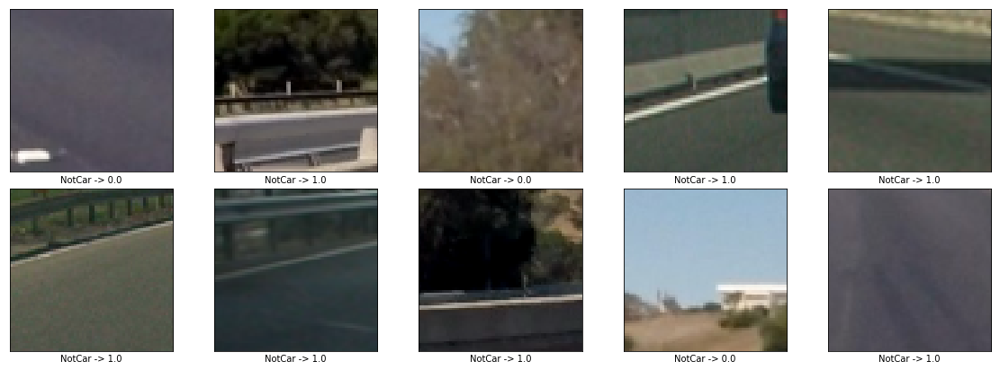

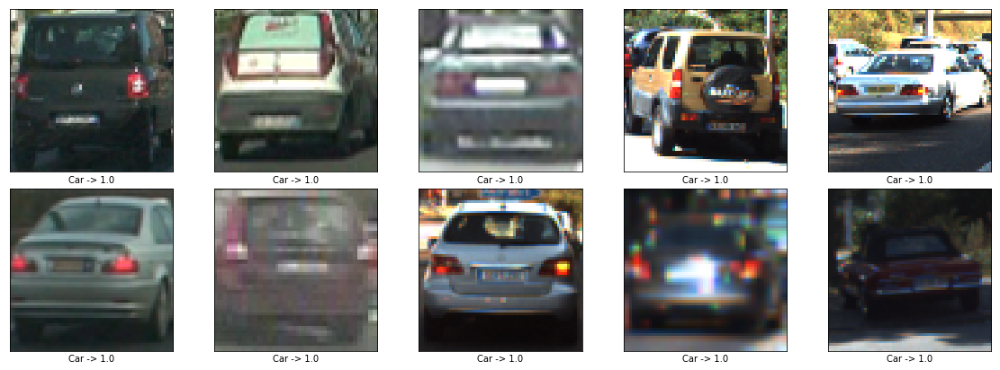

In [88]:
plot_images(imgs_notcars, labels_notcars, notcars_preds)
plot_images(imgs_cars, labels_cars, cars_preds)

### ** Test Results: **
- Cars predictions are all corrrect.
- NotCars predictions 3 corrrect 7 incorrect.
- **Conclusion**: the model struggles in predicting notCar images. It seems that it predicts images with line shape as car. Logically it is better to have false positive than false negative in driving scenario. False negative means it is car but predict as NotCar. Driver may end up hitting a vehicle in front. 

### SAVE Model and Parameters

In [89]:
svc_params = {}
svc_params["color_space"] = color_space
svc_params["orient"] = orient
svc_params["pix_per_cell"] = pix_per_cell
svc_params["cell_per_block"] = cell_per_block
svc_params["hog_channel"] = hog_channel
svc_params["spatial_size"] = spatial_size
svc_params["hist_bins"] = hist_bins
svc_params["spatial_feat"] = spatial_feat
svc_params["hist_feat"] = hist_feat
svc_params["hog_feat"] = hog_feat

svc_params["svc"] = svc
svc_params["scaler"] = X_scaler

In [90]:
print(svc_params["color_space"], svc_params["orient"], svc_params["pix_per_cell"])
print(svc_params["cell_per_block"], svc_params["hog_channel"], svc_params["spatial_size"])
print(svc_params["hist_bins"],svc_params["spatial_feat"],svc_params["hist_feat"],svc_params["hog_feat"])
print(svc_params["svc"])
print(svc_params["scaler"])

YCrCb 9 8
2 ALL (32, 32)
32 True True True
LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
StandardScaler(copy=True, with_mean=True, with_std=True)


In [91]:
# SAVE
with open('svc_params.pkl', 'wb') as handle:
    pickle.dump(svc_params,handle)

# Step 2: Make a Pipeline
- [Searching windows]
- For each window in [Searching windows]:
  - Extract features: resize, color histogram, HOG, normalization
  - Apply features into classifier, predict if it is car or not-car.
    - If it is car, draw a bounding box.


  - Return the image with drawn bounding boxes

## 2.1 Sliding Window

In [35]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

### 2.1.2 Sliding Window first try

In [36]:
img = mpimg.imread('test_images/test1.jpg')

bboxes = slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img, bboxes, color=(0, 0, 255), thick=6)

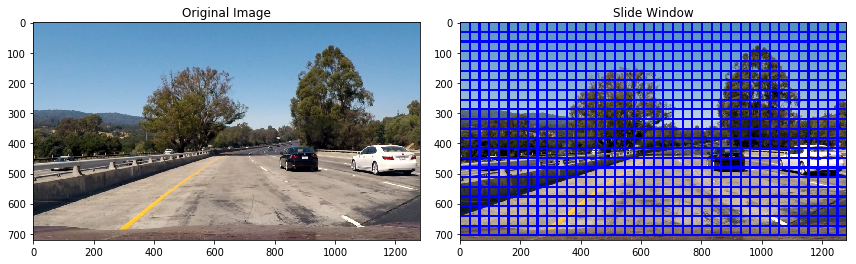

In [39]:
# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

### 2.1.2 No need to slide through the whole image

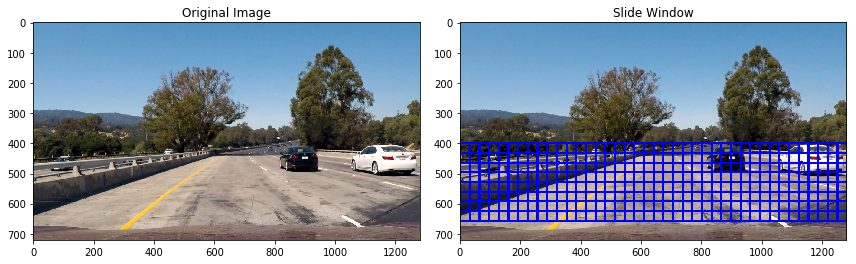

In [65]:
img = mpimg.imread('test_images/test1.jpg')

### No need to slide through whole images. ##########
ystart = 400
ystop = 656

bboxes = slide_window(img, x_start_stop=[None, None], y_start_stop=[ystart, ystop], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img, bboxes, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

### 2.1.3 Sliding box is too small - need to scale

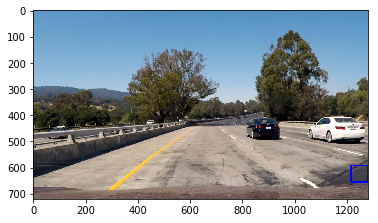

In [66]:
### Let's Visualize how big each window it ##############
plt.imshow(draw_boxes(img, [bboxes[-1]], color=(0, 0, 255), thick=6))

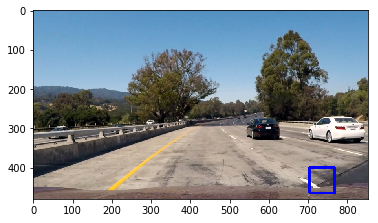

In [80]:
### Scale the image, so that (64,64) can cover up the car image. ###############
scale = 1.5
img1 = cv2.resize(img, (np.int(img.shape[1]/scale), np.int(img.shape[0]/scale)))
### Let's Visualize how big each window it ##############
plt.imshow(draw_boxes(img1, [bboxes[22]], color=(0, 0, 255), thick=6))

#### LOOK Good!! Let's try it on the whole image.

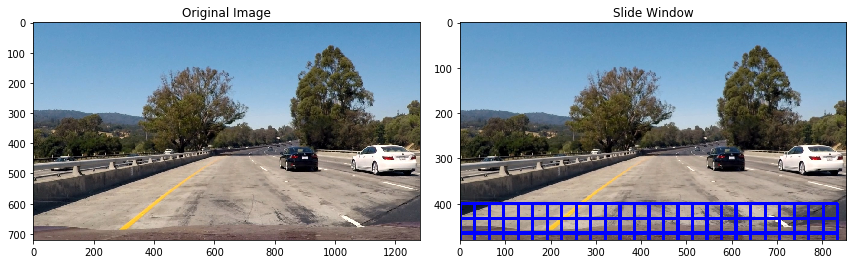

In [79]:
img = mpimg.imread('test_images/test1.jpg')

### No need to slide through whole images. ##########
ystart = 400
ystop = 656
### Scale the image size. ###########################
scale = 1.5
img1 = cv2.resize(img, (np.int(img.shape[1]/scale), np.int(img.shape[0]/scale)))

bboxes = slide_window(img1, x_start_stop=[None, None], y_start_stop=[ystart, ystop], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img1, bboxes, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

#### OOPS!! Boxes are not coverting the meant areas.  The reason is that I scaled the image, so I need scale ystart and ystop accordingly.

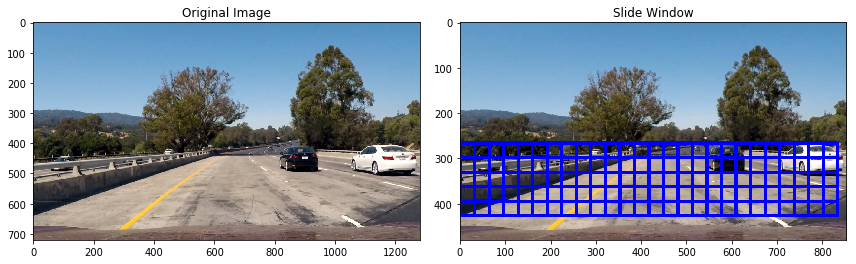

In [103]:
img = mpimg.imread('test_images/test1.jpg')

### No need to slide through whole images. ##########
ystart = 400
ystop = 656
### Need to Scale up the window size. ###############
scale = 1.5
img1 = cv2.resize(img, (np.int(img.shape[1]/scale), np.int(img.shape[0]/scale)))

bboxes = slide_window(img1, x_start_stop=[None, None], y_start_stop=[np.int(ystart/scale), np.int(ystop/scale)], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img1, bboxes, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

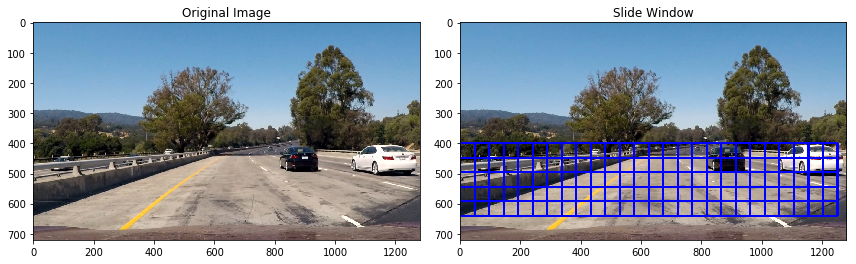

In [124]:
img = mpimg.imread('test_images/test1.jpg')

### No need to slide through whole images. ##########
ystart = 400
ystop = 656
### Need to Scale up the window size. ###############
window = 64
scale = 1.5
window = np.int(window*scale)

windows = slide_window(img, x_start_stop=[None, None], y_start_stop=[ystart, ystop], 
                    xy_window=(window, window), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img, windows, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

## 2.2 Search windows and Test

In [159]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):
    

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        # Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64)) 
        
        ####### Extract Features #######################################
        features = features_extraction(test_img, color_space=color_space, 
                                spatial_size=spatial_size, hist_bins=hist_bins, 
                                orient=orient, pix_per_cell=pix_per_cell, 
                                cell_per_block=cell_per_block, 
                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                hist_feat=hist_feat, hog_feat=hog_feat)

        ####### Normalize features ####################################
        test_features = scaler.transform(np.array(features).reshape(1, -1)) 
        
        

        ####### Predict ################################################
        prediction = clf.predict(test_features)
        #If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    print(test_img.shape)
    return on_windows    

In [140]:
############# Parameters and the model #######################################################
# LOAD the model and parameters
with open('svc_params.pkl', 'rb') as handle:
    svc_params = pickle.load(handle)

color_space = svc_params["color_space"]
orient = svc_params["orient"] 
pix_per_cell = svc_params["pix_per_cell"]  
cell_per_block = svc_params["cell_per_block"]
hog_channel = svc_params["hog_channel"] 
spatial_size = svc_params["spatial_size"]
hist_bins = svc_params["hist_bins"]
spatial_feat = svc_params["spatial_feat"]
hist_feat = svc_params["hist_feat"] 
hog_feat = svc_params["hog_feat"] 

svc = svc_params["svc"]
X_scaler = svc_params["scaler"]

### No need to slide through whole images. ##########
ystart = 400
ystop = 656
### Need to Scale up the window size. ###############
window = 64
scale = 1.5
window = np.int(window*scale)

In [160]:
on_windows =  search_windows(img, windows, clf = svc, scaler = X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    hist_range=(0, 256), orient=orient, 
                    pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                    hog_channel=hog_channel, spatial_feat=True, 
                    hist_feat=True, hog_feat=True)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


(64, 64, 3)


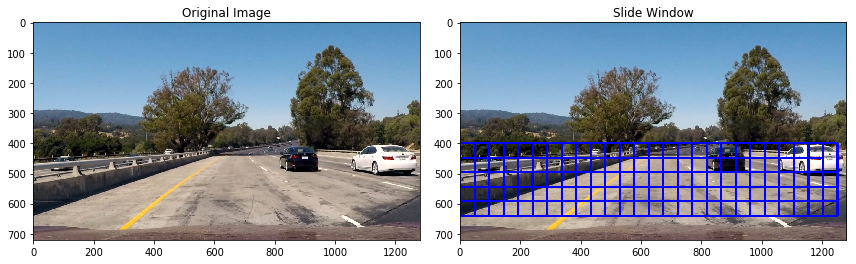

In [158]:
out_img =  draw_boxes(img, on_windows, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

--- 
## THIS IS NOT RIGHT !!!!!!!!!! WHAT IS PROBLEM??????. FRUSTRATING !!!!!!!!!!!!!!!!!!!!!!!! SVC model test accuracy is high, but not able to predict cars in the image frame. I bet the problem is in extracted features. May be the trained features and extract features are not the same. I used CV2 to read images when I was training. But I adapted matplotlib image to read when extracting features from frame image. 
---
## I decided to RE-build the classifier from the begining. 

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from skimage.feature import hog
import pickle

import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

from scipy.ndimage.measurements import label

############ Created a helper to keep all functions ###################################################
from vehicle_detection_helper import * 

C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [4]:
# Read in cars and notcars
folders_car = glob.glob('data/vehicles/*')
folders_notcar = glob.glob('data/non-vehicles/*')

car_folder_names = [f.split('\\')[-1] for f in folders_car]
notcar_folder_names  = [f.split('\\')[-1] for f in folders_notcar]

# create lists to collect data
cars = []
notcars = []

for folder in car_folder_names:
    f_names = glob.glob('data/vehicles/'+ folder + '/*.png')
    for f_name in f_names:
        cars.append(f_name)
        
for folder in notcar_folder_names:
    f_names = glob.glob('data/non-vehicles/'+ folder + '/*.png')
    for f_name in f_names:
        notcars.append(f_name)
        
        
###### First Time Try: Reduce the sample size to see if code is working #########################
#sample_size = 500
#cars = cars[0:sample_size]
#notcars = notcars[0:sample_size]

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
25.84 Seconds to train SVC...
Test Accuracy of SVC =  0.9885


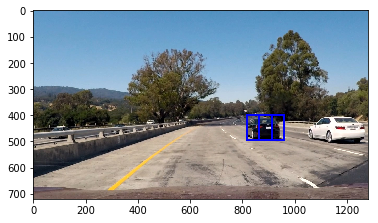

In [5]:

### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 656] # Min and max in y to search in slide_window()

car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

image = mpimg.imread('test_images/test1.jpg')
draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
image = image.astype(np.float32)/255

windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))

hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


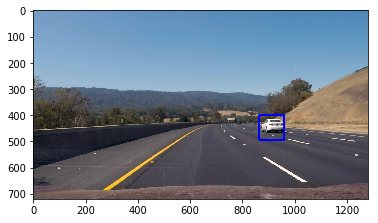

In [6]:
### Test in another image 
image = mpimg.imread('test_images/test3.jpg')
draw_image = np.copy(image)
image = image.astype(np.float32)/255
windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))
hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


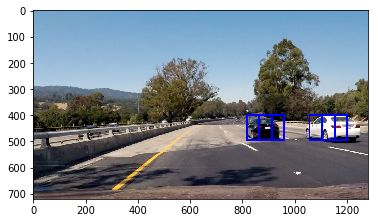

In [16]:
### Test in another image 
image = mpimg.imread('test_images/test4.jpg')
draw_image = np.copy(image)
image = image.astype(np.float32)/255
windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))
hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)

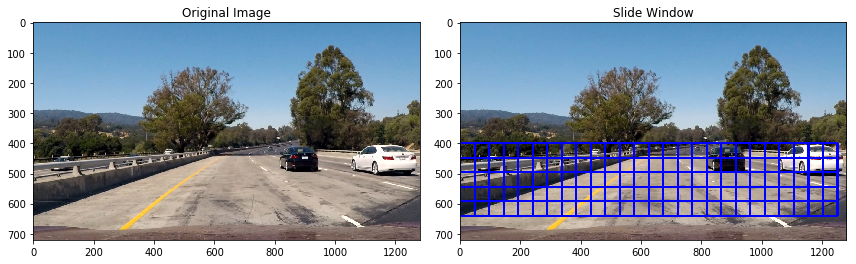

In [7]:
img = mpimg.imread('test_images/test1.jpg')

### No need to slide through whole images. ##########
ystart = 400
ystop = 656
### Need to Scale up the window size. ###############
window = 64
scale = 1.5
window = np.int(window*scale)

windows = slide_window(img, x_start_stop=[None, None], y_start_stop=[ystart, ystop], 
                    xy_window=(window, window), xy_overlap=(0.5, 0.5))

out_img =  draw_boxes(img, windows, color=(0, 0, 255), thick=6)

# Plot the original and output
fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(img)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(out_img)
plt.title('Slide Window')
fig.tight_layout()

### Seems GOOD, TIME TO SAVE 

In [7]:
svc_params = {}

svc_params["svc"] = svc
svc_params["scaler"] = X_scaler

In [8]:
# SAVE
with open('svc.pkl', 'wb') as handle:
    pickle.dump(svc_params,handle)

# RE-Build the pipeline

### Load Everything
- Dependencies
- Helper functions
- Parameters
- Modle: SVC, Scaler

In [4]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from skimage.feature import hog
import pickle

import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

from scipy.ndimage.measurements import label

############ Created a helper to keep all functions ###################################################
from vehicle_detection_helper import *

In [8]:
####################### PARAMETERS #################################################.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
scale = 1.5 # scale the sliding window size
# LOAD the model
with open('svc.pkl', 'rb') as handle:
    svc_params = pickle.load(handle)

svc = svc_params["svc"]
X_scaler = svc_params["scaler"]

In [54]:
# Create a pipeline
def pipeline(image, y_start_stop=y_start_stop, scale=scale, svc=svc, X_scaler=X_scaler, 
             orient=orient, pix_per_cell=pix_per_cell,cell_per_block=cell_per_block,
             spatial_size=spatial_size,hist_bins=hist_bins,
             color_space=color_space,hog_channel=hog_channel,
             spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat):
    
    ######################### Preprocessing #######################################
    # make a copy to draw boxes on
    draw_image = np.copy(image)
    
    # Conver Pixel values to (0,1)
    image = image.astype(np.float32)/255
    
    ######################### Slide Window #########################################    
    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop,
                           xy_window=(np.int(64*scale), np.int(64*scale)), xy_overlap=(0.5, 0.5))
    
    ######################### Search Windows #######################################
    ### Extract Features ########################
    ### ----> Spacial features
    ### ----> Color histograms features
    ### ----> HOG features
    ### Normalize features ######################
    ### Predict #################################   
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 
    
    ######################### Draw Bounding boxes ##################################    
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)  

    return window_img

### Test pipeline with a image

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


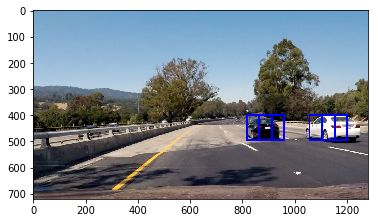

In [55]:
### Read in an image 
image = mpimg.imread('test_images/test4.jpg')
output = pipeline(image)
plt.imshow(output)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


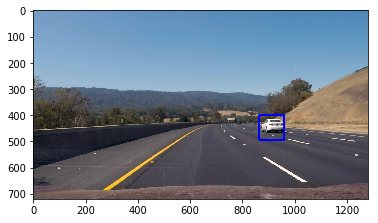

In [56]:
### Read in an image 
image = mpimg.imread('test_images/test3.jpg')
output = pipeline(image)
plt.imshow(output)

### Test pipeline with many images

In [13]:
images = glob.glob('test_images/*.jpg')
images

['test_images\\test1.jpg',
 'test_images\\test2.jpg',
 'test_images\\test3.jpg',
 'test_images\\test4.jpg',
 'test_images\\test5.jpg',
 'test_images\\test6.jpg']

In [57]:
images = glob.glob('test_images/*.jpg')
outputs = []
for img in images:
    ### Read in an image 
    image = mpimg.imread(img)
    output = pipeline(image)
    outputs.append(output)

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


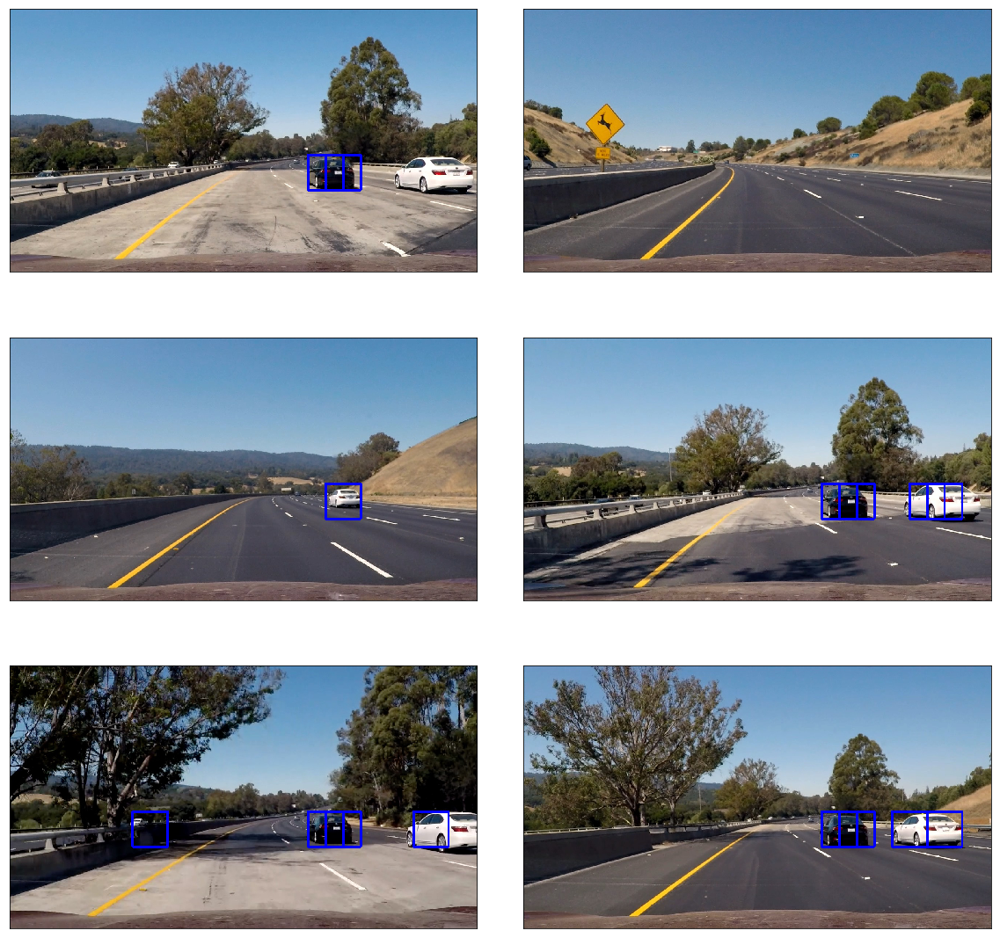

In [62]:
# Plot the outputs
rows = int(np.ceil(len(images)/2))
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(20,20))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, ax in enumerate(axes.flat):
    # Plot image.
    ax.imshow(outputs[i])
    # set xlabel
    #ax.set_xlabel(xlabel)
    # Remove ticks from the plot.
    ax.set_xticks([])
    ax.set_yticks([])

# Step 3: Test on videos

### Try1: test on a short video [subclip(7,11)]; mainly check if the pipeline is working or not

In [66]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [71]:
output = 'project_video_output1.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
clip1 = VideoFileClip("project_video.mp4").subclip(7,11)
#clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output1.mp4
[MoviePy] Writing video project_video_output1.mp4


 99%|███████████████████████████████████████████████████████████████████████████████▏| 100/101 [00:50<00:00,  1.96it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output1.mp4 

Wall time: 51.6 s


In [72]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

**Result:**
- Pipeline is too slow.
- Too many bounding boxes: overlapping detections and false positives

## Apply heat map to eliminate noisy boxes
- remove overlapping detections
- remove false positives

In [76]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap # Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

In [89]:
# Read in image
image =  mpimg.imread('test_images/test4.jpg')
# create a binary image with values of 0s
heat = np.zeros_like(image[:,:,0]).astype(np.float)

image1 = np.copy(image)
image1 = image1.astype(np.float32)/255
windows = slide_window(image1, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.5, 0.5))
hot_windows = search_windows(image1, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

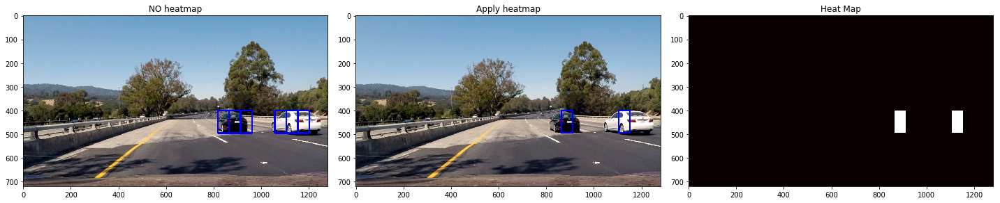

In [91]:
# Add heat to each box in box list
heat = add_heat(heat,hot_windows)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

output = pipeline(image)

fig = plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(output)
plt.title('NO heatmap')
plt.subplot(132)
plt.imshow(draw_img)
plt.title('Apply heatmap')
plt.subplot(133)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()


**Results: NOT Satisfying!!! In order to apply heatmap, we need to have many bounding boxes detection. It is too few now. We need more overlapping detections. Let's update the overlapping parameter and try it again !!!**


## UPDATE the overlapping parameter in the sliding window: 0.5 to 0.75

In [93]:
####################### PARAMETERS #################################################.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
scale = 1.5 # scale the sliding window size
overlap = 0.75 # 0.5 # overlapping parameter for slide window
# LOAD the model
with open('svc.pkl', 'rb') as handle:
    svc_params = pickle.load(handle)

svc = svc_params["svc"]
X_scaler = svc_params["scaler"]

In [95]:
# Create a pipeline
def pipeline(image, y_start_stop=y_start_stop, scale=scale, svc=svc, X_scaler=X_scaler, 
             orient=orient, pix_per_cell=pix_per_cell,cell_per_block=cell_per_block,
             spatial_size=spatial_size,hist_bins=hist_bins,
             color_space=color_space,hog_channel=hog_channel, overlap=overlap,
             spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat):
    
    ######################### Preprocessing #######################################
    # make a copy to draw boxes on
    draw_image = np.copy(image)
    
    # Conver Pixel values to (0,1)
    image = image.astype(np.float32)/255
    
    ######################### Slide Window #########################################    
    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop,
                           xy_window=(np.int(64*scale), np.int(64*scale)), xy_overlap=(overlap, overlap))
    
    ######################### Search Windows #######################################
    ### Extract Features ########################
    ### ----> Spacial features
    ### ----> Color histograms features
    ### ----> HOG features
    ### Normalize features ######################
    ### Predict #################################   
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 
    
    ######################### Draw Bounding boxes ##################################    
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)  

    return window_img

### Try again                      

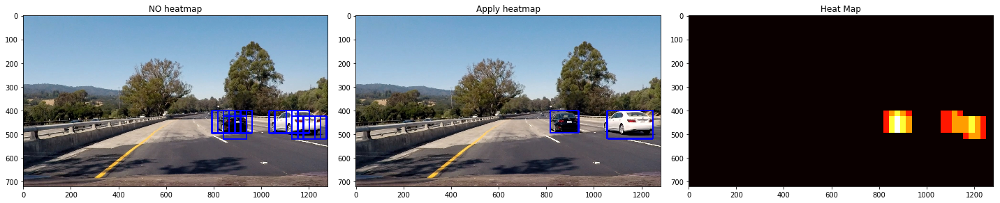

In [97]:
# Read in image
image =  mpimg.imread('test_images/test4.jpg')
# create a binary image with values of 0s
heat = np.zeros_like(image[:,:,0]).astype(np.float)

image1 = np.copy(image)
image1 = image1.astype(np.float32)/255
windows = slide_window(image1, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(0.75, 0.75))
hot_windows = search_windows(image1, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 

# Add heat to each box in box list
heat = add_heat(heat,hot_windows)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

output = pipeline(image)

fig = plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(output)
plt.title('NO heatmap')
plt.subplot(132)
plt.imshow(draw_img)
plt.title('Apply heatmap')
plt.subplot(133)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()


In [107]:
outputs = []
imgs = glob.glob('test_images/*.jpg')
for img in imgs:

    # Read in image
    image =  mpimg.imread(img)
    # create a binary image with values of 0s
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    image1 = np.copy(image)
    image1 = image1.astype(np.float32)/255
    windows = slide_window(image1, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(96, 96), xy_overlap=(0.75, 0.75))
    hot_windows = search_windows(image1, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat) 

    # Add heat to each box in box list
    heat = add_heat(heat,hot_windows)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    output = pipeline(image)
    
    outputs.append(output)
    outputs.append(draw_img)
    outputs.append(heatmap)

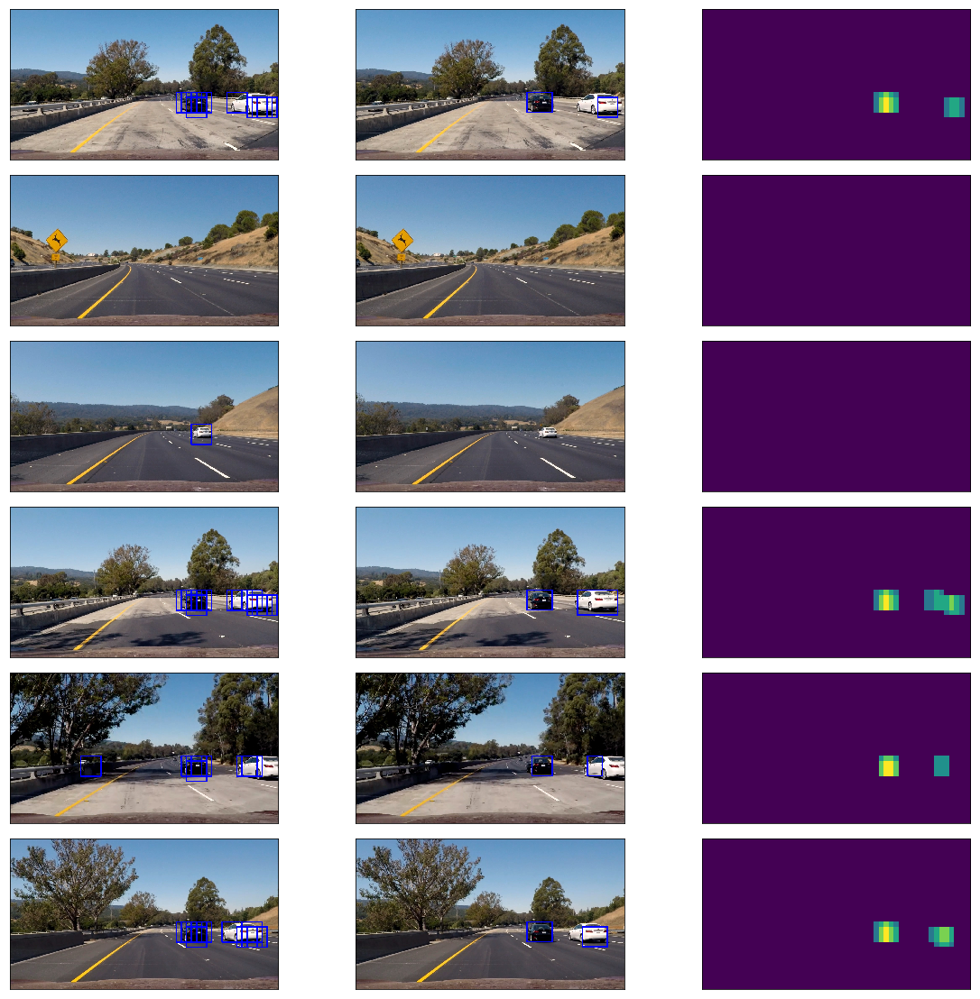

In [115]:
# Plot the outputs
rows = len(images)
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(20,20))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, ax in enumerate(axes.flat):
    ax.imshow(outputs[i])
    #ax.imshow(outputs[i],cmap='gray')
    # set xlabel
    #ax.set_xlabel(xlabel)
    # Remove ticks from the plot.
    ax.set_xticks([])
    ax.set_yticks([])

### Update heatmap threshold
- try 1: 0.5, end up with a few false postives.
- try 2: 0.75, ONLY one false positive in image 5.
- try 3: 0.85, same as try 2.
- try 4: 0.95, same as try 2.

In [123]:
outputs = []
imgs = glob.glob('test_images/*.jpg')
for img in imgs:

    # Read in image
    image =  mpimg.imread(img)
    # create a binary image with values of 0s
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    image1 = np.copy(image)
    image1 = image1.astype(np.float32)/255
    windows = slide_window(image1, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                        xy_window=(96, 96), xy_overlap=(0.75, 0.75))
    hot_windows = search_windows(image1, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat) 

    # Add heat to each box in box list
    heat = add_heat(heat,hot_windows)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,0.95)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    output = pipeline(image)
    
    outputs.append(output)
    outputs.append(draw_img)
    outputs.append(heatmap)

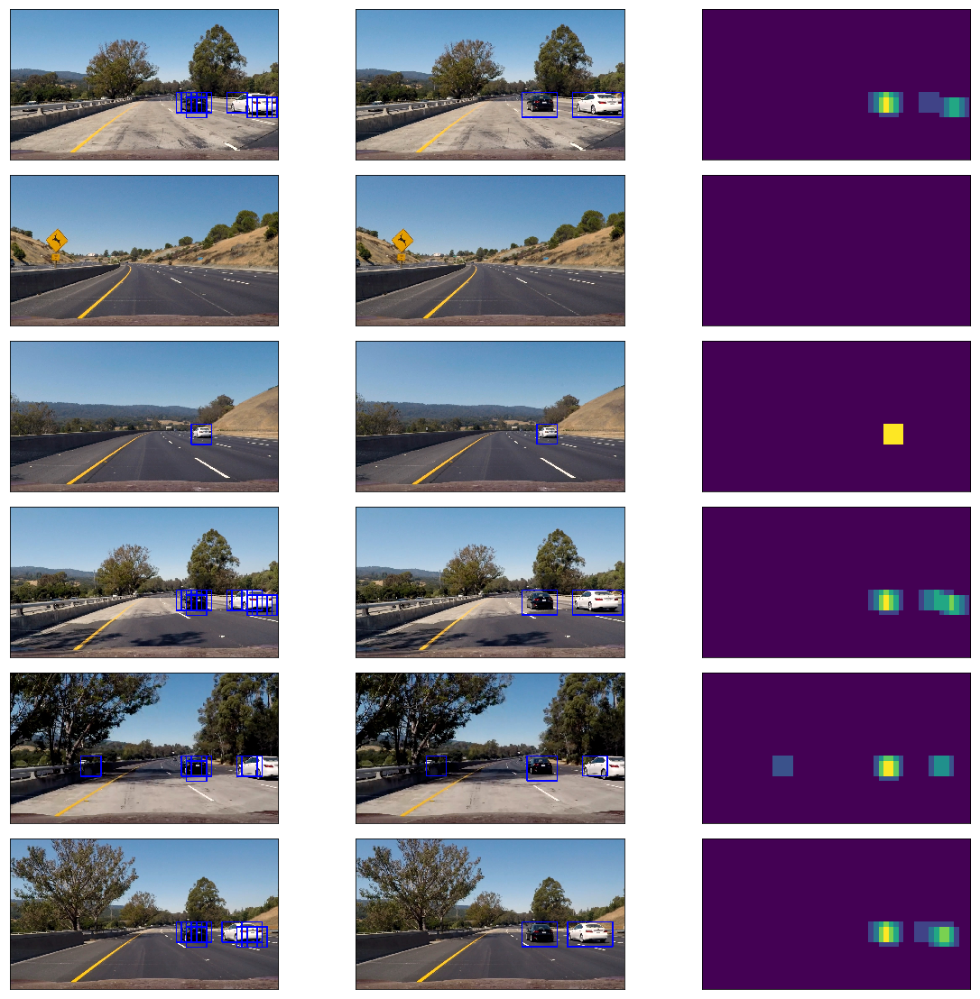

In [124]:
# Plot the outputs
rows = len(images)
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(20,20))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, ax in enumerate(axes.flat):
    ax.imshow(outputs[i])
    #ax.imshow(outputs[i],cmap='gray')
    # set xlabel
    #ax.set_xlabel(xlabel)
    # Remove ticks from the plot.
    ax.set_xticks([])
    ax.set_yticks([])

## Adding heatmap technique into the Pipeline

In [1]:
###################### Load dependencies #############################################################
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from skimage.feature import hog
import pickle

import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

from scipy.ndimage.measurements import label

##################### Created a helper to keep all functions ########################################
from vehicle_detection_helper import *

##################### PARAMETERS ####################################################################
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
scale = 1.5 # scale the sliding window size
overlap = 0.75 # 0.5 # overlapping parameter for slide window
heat_threshold = 0.75 # heatmap threshold

##################### MODEL - Classifier ############################################################
# LOAD the model
with open('svc.pkl', 'rb') as handle:
    svc_params = pickle.load(handle)

svc = svc_params["svc"]
X_scaler = svc_params["scaler"]

C:\Anaconda3\envs\carnd-term1\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
# Create a pipeline
def pipeline(image, y_start_stop=y_start_stop, scale=scale, svc=svc, X_scaler=X_scaler, 
             orient=orient, pix_per_cell=pix_per_cell,cell_per_block=cell_per_block,
             spatial_size=spatial_size,hist_bins=hist_bins,
             color_space=color_space,hog_channel=hog_channel, overlap=overlap, heat_threshold=heat_threshold,
             spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat):
    
    ######################### Preprocessing #######################################
    # make a copy to draw boxes on
    draw_image = np.copy(image)
    
    # Conver Pixel values to (0,1)
    image = image.astype(np.float32)/255
    
    ######################### Slide Window #########################################    
    windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop,
                           xy_window=(np.int(64*scale), np.int(64*scale)), xy_overlap=(overlap, overlap))
    
    ######################### Search Windows #######################################
    ### Extract Features ########################
    ### ----> Spacial features
    ### ----> Color histograms features
    ### ----> HOG features
    ### Normalize features ######################
    ### Predict #################################   
    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 
    
    
    ######################### Heatmap threshold #####################################
    # create a binary image with values of 0s
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    
    # Add heat to each box in box list
    heat = add_heat(heat,hot_windows)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,heat_threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(draw_image, labels)
     

    return draw_img

C:\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


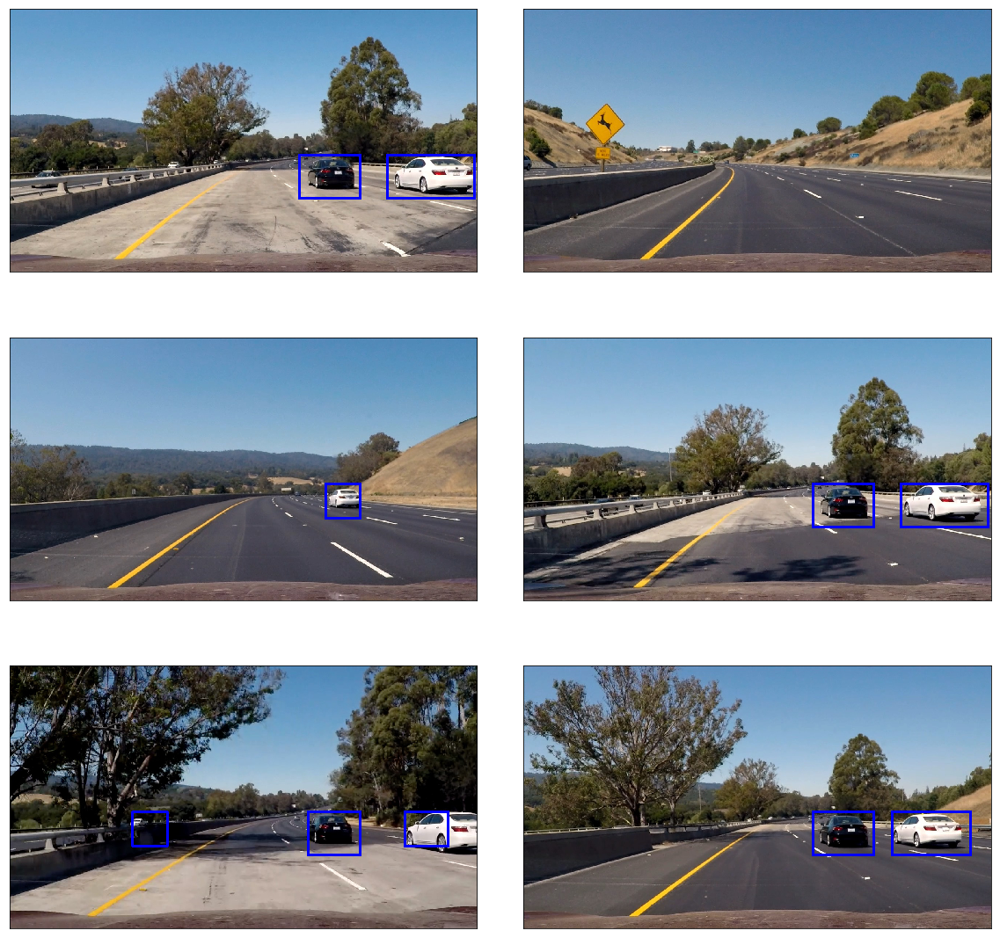

In [3]:
images = glob.glob('test_images/*.jpg')
outputs = []
for img in images:
    ### Read in an image 
    image = mpimg.imread(img)
    output = pipeline(image)
    outputs.append(output)

# Plot the outputs
rows = int(np.ceil(len(images)/2))
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(20,20))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, ax in enumerate(axes.flat):
    # Plot image.
    ax.imshow(outputs[i])
    # set xlabel
    #ax.set_xlabel(xlabel)
    # Remove ticks from the plot.
    ax.set_xticks([])
    ax.set_yticks([])

## Try 2: test on a short video [subclip(7,11)];

In [4]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [5]:
output = 'project_video_output2.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
clip1 = VideoFileClip("project_video.mp4").subclip(7,11)
#clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output2.mp4
[MoviePy] Writing video project_video_output2.mp4


 99%|███████████████████████████████████████████████████████████████████████████████▏| 100/101 [02:43<00:01,  1.64s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output2.mp4 

Wall time: 2min 45s


In [6]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

## Try 3: test on whole video

In [3]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [4]:
output = 'project_video_output3.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
#clip1 = VideoFileClip("project_video.mp4").subclip(7,11)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output3.mp4
[MoviePy] Writing video project_video_output3.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [35:47<00:01,  1.68s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output3.mp4 

Wall time: 35min 48s


In [5]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))